<a href="https://colab.research.google.com/github/joragui2005/Codility/blob/master/Notebooks/Churn_Telecom.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

El conjunto de Datos fue obtenido de Kaggle [Telecom Churn Dataset](https://www.kaggle.com/datasets/mnassrib/telecom-churn-datasets?datasetId=255093&sortBy=voteCount&select=churn-bigml-80.csv)


# Bibliotecas

In [ ]:
!pip install dtreeviz  # versión 2.2.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 1.2 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd

# Funciones específicas de Sckit-learn
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_curve, auc

# Para visualizar el árbol de decisión
import graphviz
import dtreeviz

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Funciones

In [ ]:
def describe_datos(df):
    unicos =[]
    for col in df:
        unicos.append(df[col].unique())
    unicos = pd.Series(unicos, index=df.columns)
    descripcion = pd.concat([df.dtypes, df.isna().sum(),df.nunique(),unicos], axis=1)
    descripcion.columns = ['dtypes', 'null','nunique','unique' ]
    return(descripcion)

# 1. Lectura de datos y breve exploración

In [69]:
#df = pd.read_csv('https://raw.githubusercontent.com/AnIsAsPe/ClasificadorClientesTelecom/master/Datos/churn_telecom_espa%C3%B1ol.csv')
#print(df.shape)
#df.head(3)

#import io
# from google.colab import files

# Sube el archivo desde tu computadora
# uploaded = files.upload()

df = pd.read_csv(io.BytesIO(uploaded['FraudeCanastas (1).csv']))
print(df.shape)
df.head(3)

# Leer los datos desde un csv local


(9319, 2457)


,ID,APPLE PRODUCTDESCRIPTION | SAMSUNG | MODEL90,AUDIO ACCESSORIES | AB AUDIO | AB AUDIO GO AIR TRUE WIRELESS BLUETOOTH IN-EAR H,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE 2ND GENERATI,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE 2ND,AUDIO ACCESSORIES | APPLE | 2021 APPLE AIRPODS WITH MAGSAFE CHARGING CASE 3RD,AUDIO ACCESSORIES | APPLE | AIRPODS PRO,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX NOISE CANCELLING WIRELESS BLUETO,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS PRO WITH MAGSAFE CHARGING CASE,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS PRO WITH WIRELESS CHARGING CASE,AUDIO ACCESSORIES | APPLE | APPLE EARPODS WITH REMOTE AND MIC LIGHTNING CONNEC,AUDIO ACCESSORIES | APPLE | APPLE EARPODS WITH REMOTE AND MIC WHITE,AUDIO ACCESSORIES | APPLE | RETAILER,AUDIO ACCESSORIES | BEATS | BEATS STUDIO BUDS TRUE WIRELESS BLUETOOTH IN-EAR H,AUDIO ACCESSORIES | BEATS | POWERBEATS PRO TRUE WIRELESS BLUETOOTH IN-EAR SPOR,AUDIO ACCESSORIES | BEATS | SOLO3,AUDIO ACCESSORIES | BOSE | BOSE QUIETCOMFORT EARBUDS NOISE CANCELLING TRUE WI,AUDIO ACCESSORIES | BOSE | BOSE SOUNDSPORT SWEAT WEATHER-RESISTANT WIRELESS I,AUDIO ACCESSORIES | BOSE | RETAILER,AUDIO ACCESSORIES | JABRA | JABRA ELITE 45H WIRELESS BLUETOOTH ON-EAR HEADPHON,AUDIO ACCESSORIES | LG | LG TONE FREE HBS-FN4 TRUE WIRELESS BLUETOOTH IN-EA,AUDIO ACCESSORIES | LG | LG TONE FREE UFP9 PLUG WIRELESS TRUE WIRELESS BLUE,...,WOMEN S CLOTHES | LEVI S | LEVI S 721 HIGH RISE SKINNY JEANS BLACK W28 L30,WOMEN S CLOTHES | LEVI S | LEVI S 724 HIGH RISE STRAIGHT JEANS SPILL THE TEA,WOMEN S CLOTHES | SERAPHINE | SERAPHINE HOLI MATERNITY LEGGINGS BLACK S,WOMEN S CLOTHES | SOSANDAR | SOSANDAR ANIMAL SPOT TULIP DRESS KHAKI 20,WOMEN S CLOTHES | VENICE BEACH | VENICE BEACH LOU GYM VEST HOT PINK M,WOMEN S CLOTHES | VENICE BEACH | VENICE BEACH LOU GYM VEST RAPTURE ROSE M,WOMEN S CLOTHES | WHITE STUFF | WHITE STUFF COWBERRY HOODED SWEATSHIRT DARK BLUE 1,WOMEN S CLOTHES | WHITE STUFF | WHITE STUFF HAWTHORN ORGANIC COTTON WOOL BLEND CAR,WOMEN S FOOTWEAR | GABOR | GABOR BULNER LEATHER HI-TOP TRAINERS BLACK 6,WOMEN S FOOTWEAR | GABOR | GABOR BULNER LEATHER HI-TOP TRAINERS TAN 6,WOMEN S FOOTWEAR | GABOR | GABOR LANZAROTE SLIP ON SANDALS NAVY 6,WOMEN S FOOTWEAR | GOLA | GOLA GRANDSLAM MAMBA CHEETAH PRINT TRAINERS SILVER,WOMEN S FOOTWEAR | MINT VELVET | MINT VELVET CAMILLE LEATHER LOAFERS BLACK 7,WOMEN S FOOTWEAR | ROCKET DOG | ROCKET DOG CHEERY CANVAS TRAINERS WHITE 3,WOMEN S FOOTWEAR | UGG | UGG CLASSIC MINI II SHORT SHEEPSKIN BOOTS CHESTNUT,WOMEN S NIGHTWEAR | ANYDAY RETAILER | ANYDAY RETAILER LEOPARD PRINT JERSEY PY,WOMEN S NIGHTWEAR | RETAILER | RETAILER CLEO VELOUR JOGGER LOUNGE PANT,WOMEN S NIGHTWEAR | SOSANDAR | SOSANDAR ZEBRA PRINT PYJAMA BOTTOMS BLACK 10,Nb_of_items,total_of_items,costo_total,costo_medio_item,costo_item_max,costo_item_min,fraud_flag
0,130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2,1299,649.5,1299,0.0,1.0
1,195,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3,4119,1373.0,2470,0.0,1.0
2,217,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2,2806,1403.0,2799,7.0,1.0


In [70]:
df.info()
# print(len(df))
# df.isnull().any()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9319 entries, 0 to 9318
Columns: 2457 entries, ID to fraud_flag
dtypes: float64(2452), int64(5)
memory usage: 174.7 MB


In [71]:
describe_datos(df)

,dtypes,null,nunique,unique
ID,int64,0,9319,"[130, 195, 217, 552, 854, 855, 856, 941, 1157,..."
APPLE PRODUCTDESCRIPTION | SAMSUNG | MODEL90,float64,0,2,"[0.0, 1000.0]"
AUDIO ACCESSORIES | AB AUDIO | AB AUDIO GO AIR TRUE WIRELESS BLUETOOTH IN-EAR H,float64,0,2,"[0.0, 20.0]"
AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE,float64,0,8,"[0.0, 125.0, 119.0, 120.0, 500.0, 129.0, 109.0..."
AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE 2ND GENERATI,float64,0,8,"[0.0, 109.0, 100.0, 105.0, 104.0, 99.0, 119.0,..."
...,...,...,...,...
costo_total,int64,0,1639,"[1299, 4119, 2806, 1206, 1807, 1263, 942, 1199..."
costo_medio_item,float64,0,2034,"[649.5, 1373.0, 1403.0, 603.0, 66.925925925925..."
costo_item_max,int64,0,540,"[1299, 2470, 2799, 1199, 195, 280, 938, 929, 1..."
costo_item_min,float64,0,528,"[0.0, 7.0, 4.0, 1249.0, 25.0, 2470.0, 999.0, 1..."


In [73]:
df['fraud_flag'].value_counts(normalize=True)

,proportion
fraud_flag,
0.0,0.858461
1.0,0.141539


In [85]:
from sklearn.feature_selection import VarianceThreshold

# Filtrar columnas con muy baja variabilidad
selector = VarianceThreshold(threshold=5)  # Columnas con menos del 1% de variabilidad
X_filtered = selector.fit_transform(df)  # X es tu DataFrame sin la columna "fraude"

describe_datos(pd.DataFrame(X_filtered))


,dtypes,null,nunique,unique
0,float64,0,9319,"[130.0, 195.0, 217.0, 552.0, 854.0, 855.0, 856..."
1,float64,0,2,"[0.0, 1000.0]"
2,float64,0,8,"[0.0, 125.0, 119.0, 120.0, 500.0, 129.0, 109.0..."
3,float64,0,8,"[0.0, 109.0, 100.0, 105.0, 104.0, 99.0, 119.0,..."
4,float64,0,4,"[0.0, 149.0, 158.0, 168.0]"
...,...,...,...,...
1458,float64,0,2,"[0.0, 259.0]"
1459,float64,0,1639,"[1299.0, 4119.0, 2806.0, 1206.0, 1807.0, 1263...."
1460,float64,0,2034,"[649.5, 1373.0, 1403.0, 603.0, 66.925925925925..."
1461,float64,0,540,"[1299.0, 2470.0, 2799.0, 1199.0, 195.0, 280.0,..."


In [88]:
# Revisamos las categorias de las variables categoricas

for col in df.select_dtypes(object).columns:
    print(pd.crosstab(df[col],
                      df['fraud_flag'],
                      normalize='index'
                      ).round(2).sort_values(by=1,  ascending=False),
          end='\n\n')

## 2. Preprocesamiento


### Binarización de variables

In [96]:
# prompt: convertir todas las columnas de tipo float a float64

for col in df.columns:
    if df[col].dtype == 'float':
        df[col] = df[col].astype('float64')


In [101]:
categoricas_cols = df.select_dtypes(np.float64).columns
categoricas_cols

Index(['APPLE PRODUCTDESCRIPTION | SAMSUNG | MODEL90',
       'AUDIO ACCESSORIES | AB AUDIO | AB AUDIO GO AIR TRUE WIRELESS BLUETOOTH IN-EAR H',
       'AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE',
       'AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE 2ND GENERATI',
       'AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE',
       'AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE 2ND',
       'AUDIO ACCESSORIES | APPLE | 2021 APPLE AIRPODS WITH MAGSAFE CHARGING CASE 3RD',
       'AUDIO ACCESSORIES | APPLE | AIRPODS PRO',
       'AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX',
       'AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX NOISE CANCELLING WIRELESS BLUETO',
       ...
       'WOMEN S FOOTWEAR | GOLA | GOLA GRANDSLAM MAMBA CHEETAH PRINT TRAINERS SILVER',
       'WOMEN S FOOTWEAR | MINT VELVET | MINT VELVET CAMILLE LEATHER LOAFERS BLACK 7',
       'WOMEN S FOOTWEAR | ROCKET DOG | ROCKET D

In [91]:
df[categoricas_cols].nunique()

,0


In [105]:
df.select_dtypes(float)

,APPLE PRODUCTDESCRIPTION | SAMSUNG | MODEL90,AUDIO ACCESSORIES | AB AUDIO | AB AUDIO GO AIR TRUE WIRELESS BLUETOOTH IN-EAR H,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH CHARGING CASE 2ND GENERATI,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE,AUDIO ACCESSORIES | APPLE | 2019 APPLE AIRPODS WITH WIRELESS CHARGING CASE 2ND,AUDIO ACCESSORIES | APPLE | 2021 APPLE AIRPODS WITH MAGSAFE CHARGING CASE 3RD,AUDIO ACCESSORIES | APPLE | AIRPODS PRO,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS MAX NOISE CANCELLING WIRELESS BLUETO,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS PRO WITH MAGSAFE CHARGING CASE,AUDIO ACCESSORIES | APPLE | APPLE AIRPODS PRO WITH WIRELESS CHARGING CASE,AUDIO ACCESSORIES | APPLE | APPLE EARPODS WITH REMOTE AND MIC LIGHTNING CONNEC,AUDIO ACCESSORIES | APPLE | APPLE EARPODS WITH REMOTE AND MIC WHITE,AUDIO ACCESSORIES | APPLE | RETAILER,AUDIO ACCESSORIES | BEATS | BEATS STUDIO BUDS TRUE WIRELESS BLUETOOTH IN-EAR H,AUDIO ACCESSORIES | BEATS | POWERBEATS PRO TRUE WIRELESS BLUETOOTH IN-EAR SPOR,AUDIO ACCESSORIES | BEATS | SOLO3,AUDIO ACCESSORIES | BOSE | BOSE QUIETCOMFORT EARBUDS NOISE CANCELLING TRUE WI,AUDIO ACCESSORIES | BOSE | BOSE SOUNDSPORT SWEAT WEATHER-RESISTANT WIRELESS I,AUDIO ACCESSORIES | BOSE | RETAILER,AUDIO ACCESSORIES | JABRA | JABRA ELITE 45H WIRELESS BLUETOOTH ON-EAR HEADPHON,AUDIO ACCESSORIES | LG | LG TONE FREE HBS-FN4 TRUE WIRELESS BLUETOOTH IN-EA,AUDIO ACCESSORIES | LG | LG TONE FREE UFP9 PLUG WIRELESS TRUE WIRELESS BLUE,AUDIO ACCESSORIES | SAMSUNG | SAMSUNG GALAXY BUDS 2 WITH QI-COMPATIBLE WIRELESS,...,WOMEN S CLOTHES | HOBBS | HOBBS SEY SLIM JEANS LIGHT INDIGO 10,WOMEN S CLOTHES | HOBBS | HOBBS SEY SLIM JEANS MID WASH 8,WOMEN S CLOTHES | LEVI S | LEVI S 310 SHAPING SUPER SKINNY JEANS BLACK SQUARE,WOMEN S CLOTHES | LEVI S | LEVI S 311 SHAPING SKINNY JEANS SOFT BLACK W29 L28,WOMEN S CLOTHES | LEVI S | LEVI S 721 HIGH RISE SKINNY JEANS BLACK W28 L30,WOMEN S CLOTHES | LEVI S | LEVI S 724 HIGH RISE STRAIGHT JEANS SPILL THE TEA,WOMEN S CLOTHES | SERAPHINE | SERAPHINE HOLI MATERNITY LEGGINGS BLACK S,WOMEN S CLOTHES | SOSANDAR | SOSANDAR ANIMAL SPOT TULIP DRESS KHAKI 20,WOMEN S CLOTHES | VENICE BEACH | VENICE BEACH LOU GYM VEST HOT PINK M,WOMEN S CLOTHES | VENICE BEACH | VENICE BEACH LOU GYM VEST RAPTURE ROSE M,WOMEN S CLOTHES | WHITE STUFF | WHITE STUFF COWBERRY HOODED SWEATSHIRT DARK BLUE 1,WOMEN S CLOTHES | WHITE STUFF | WHITE STUFF HAWTHORN ORGANIC COTTON WOOL BLEND CAR,WOMEN S FOOTWEAR | GABOR | GABOR BULNER LEATHER HI-TOP TRAINERS BLACK 6,WOMEN S FOOTWEAR | GABOR | GABOR BULNER LEATHER HI-TOP TRAINERS TAN 6,WOMEN S FOOTWEAR | GABOR | GABOR LANZAROTE SLIP ON SANDALS NAVY 6,WOMEN S FOOTWEAR | GOLA | GOLA GRANDSLAM MAMBA CHEETAH PRINT TRAINERS SILVER,WOMEN S FOOTWEAR | MINT VELVET | MINT VELVET CAMILLE LEATHER LOAFERS BLACK 7,WOMEN S FOOTWEAR | ROCKET DOG | ROCKET DOG CHEERY CANVAS TRAINERS WHITE 3,WOMEN S FOOTWEAR | UGG | UGG CLASSIC MINI II SHORT SHEEPSKIN BOOTS CHESTNUT,WOMEN S NIGHTWEAR | ANYDAY RETAILER | ANYDAY RETAILER LEOPARD PRINT JERSEY PY,WOMEN S NIGHTWEAR | RETAILER | RETAILER CLEO VELOUR JOGGER LOUNGE PANT,WOMEN S NIGHTWEAR | SOSANDAR | SOSANDAR ZEBRA PRINT PYJAMA BOTTOMS BLACK 10,costo_medio_item,costo_item_min,fraud_flag
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,649.500000,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1373.000000,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1403.000000,7.0,1.0

In [108]:
from sklearn.feature_selection import VarianceThreshold

# Filtrar columnas con muy baja variabilidad
selector = VarianceThreshold(threshold=5)  # Columnas con menos del 1% de variabilidad
X_filtered = selector.fit_transform(X)  # X es tu DataFrame sin la columna "fraude"

new_data = (pd.DataFrame(X_filtered))

# Árbol de Decisión

## Creación de subconjuntos de entrenamiento y prueba

In [112]:
#Separar las etiquetas del conjunto de datos

y = df['fraud_flag']

X = df.drop('fraud_flag', axis=1)

selector = VarianceThreshold(threshold=5)  # Columnas con menos del 1% de variabilidad
X_filtered = selector.fit_transform(X)  # X es tu DataFrame sin la columna "fraude"

new_X = (pd.DataFrame(X_filtered))

In [113]:
X_train, X_test, y_train, y_test = train_test_split(new_X, y,
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=8)

# ¿Cómo son los conjuntos de entrenamiento y prueba?
print("TRAINING SET")
print("X: ", X_train.shape)
print("y: ", y_train.shape)
print('Carritos que son fraude:{:7.3f}%'.format(y_train.mean()*100),'\n')

print("TEST SET")
print("X: ", X_test.shape)
print("y: ", y_test.shape)
print('Carritos que son fraude:{:7.3f}%'.format(y_test.mean()*100))


TRAINING SET
X:  (7455, 1463)
y:  (7455,)
Carritos que son fraude: 14.420% 

TEST SET
X:  (1864, 1463)
y:  (1864,)
Carritos que son fraude: 13.090%


## Entrenamiento y prueba del modelo

In [114]:
profundidad = None

# Entrenamiento del modelo.
clasificador = DecisionTreeClassifier( max_depth=profundidad,
                                      criterion="entropy",
                                      random_state=0)
clasificador.fit(X_train, y_train)
print("La profundida del árbol es: {}".format(clasificador.get_depth()))


# Predicción y evaluación sobre el conjunto de entrenamiento.
y_pred_train = clasificador.predict(X_train)
exactitud_train = accuracy_score(y_train, y_pred_train)*100
print("Exactitud conjunto de entrenamiento: {:4.2f}%".format(exactitud_train))


# Predicción y evaluación sobre el conjunto de prueba.
y_pred_test = clasificador.predict(X_test)
exactitud_test = accuracy_score(y_test, y_pred_test)*100
print("Exactitud conjunto de prueba: {:4.2f}%".format(exactitud_test),'\n')


La profundida del árbol es: 46
Exactitud conjunto de entrenamiento: 100.00%
Exactitud conjunto de prueba: 88.95% 



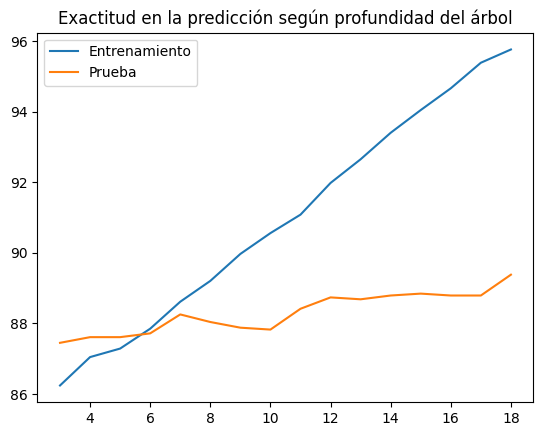

In [115]:
# Entrenamiento y prueba del modelo con distintos niveles de profunidad

clf = {}
y_pred_train = {}
y_pred_test = {}
exactitud_train={}
exactitud_test = {}

for p in range(3,19):
    # Entrenamiento del modelo
    clf[p] = DecisionTreeClassifier(max_depth = p,
                               criterion = "entropy",
                               random_state = 0).fit(X_train, y_train)

    # Predicción y evaluación sobre el conjunto de entrenamiento
    y_pred_train[p] = clf[p].predict(X_train)
    exactitud_train[p] = accuracy_score(y_train, y_pred_train[p])*100

    # Predicción y evaluación sobre el conjunto de prueba
    y_pred_test[p] = clf[p].predict(X_test)
    exactitud_test[p] = accuracy_score(y_test, y_pred_test[p])*100

exactitud_df = pd.DataFrame( {'Entrenamiento':exactitud_train,
                           'Prueba': exactitud_test})

exactitud_df.plot.line(
    title ='Exactitud en la predicción según profundidad del árbol')
plt.show()

In [116]:
exactitud_df

,Entrenamiento,Prueba
3,86.237425,87.446352
4,87.042254,87.607296
5,87.283702,87.607296
6,87.847082,87.714592
7,88.611670,88.251073
8,89.201878,88.036481
9,89.966465,87.875536
10,90.556673,87.821888
11,91.079812,88.412017
12,91.978538,88.733906


In [117]:
profundidad_optima = exactitud_df['Prueba'].idxmax()
profundidad_optima

18

In [118]:
model = clf[profundidad_optima]

## Visualización del árbol de decisión

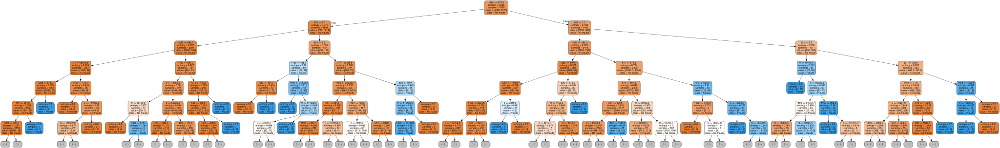

In [121]:
# Exportar el árbol como archivo.dot
dot_data = export_graphviz(model,
                           feature_names=[str(c) for c in new_X.columns], # Convert feature names to strings
                           class_names=['No fraude','Fraude'],
                           max_depth = 6,
                           rounded = True,
                           filled = True,
                           )

graph =  graphviz.Source(dot_data, format='png')

graph.render('arbol_decision')              # guarda el archivo .dot y la gráfica png
graph

In [122]:
# Ensure y_train contains only integer values
y_train = y_train.astype(int)

# Now, create the dtreeviz visualization
viz_tree = dtreeviz.model(model, X_train, y_train,
                target_name='Fraude',
                feature_names=X_train.columns,
                class_names=['No Fraude','Fraude'])

v = viz_tree.view(fontname="monospace", scale=1.2)     # render para guardar en formato
v.save("viz_tree.svg")
v

## Importancia de cada variable de acuerdo al modelo

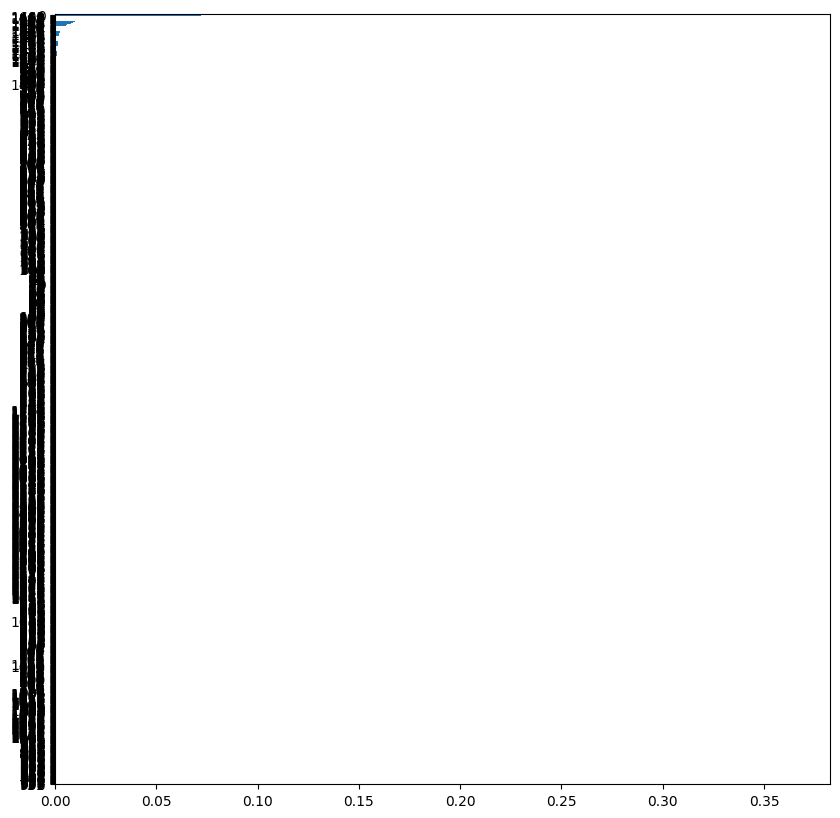

In [123]:
importancia = pd.Series(model.feature_importances_,
                    index=new_X.columns.values)

importancia.sort_values().plot(kind = 'barh',figsize=(10, 10))
plt.show()

## Matriz de confusión y minimización de errores "graves"

**Matriz de confusión**

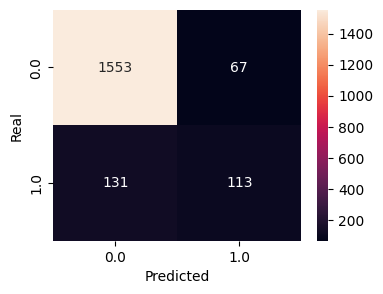

In [125]:
#Matriz de confusión
data = {'y_Real':y_test, 'y_Prediccion':model.predict(X_test)}

df = pd.DataFrame(data)
confusion_matrix = pd.crosstab(df['y_Real'], df['y_Prediccion'],
                               rownames=['Real'], colnames=['Predicted'])
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(confusion_matrix, annot=True, fmt='g')
plt.show()

In [128]:
model.predict(X_test)[0:20]

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.])

In [130]:
pd.DataFrame(model.predict_proba(X_test), columns=['No Fraude', 'Fraude']).head(20)

,No Fraude,Fraude
0,1.000000,0.000000
1,1.000000,0.000000
2,1.000000,0.000000
3,1.000000,0.000000
4,0.800000,0.200000
5,1.000000,0.000000
6,1.000000,0.000000
7,0.000000,1.000000
8,1.000000,0.000000
9,1.000000,0.000000


In [132]:
umbral = 0.15 # por arriba del cual se clasificaría como clase 1
prediccion_test = np.where( model.predict_proba(X_test)[:, 1] > umbral, 'Fraude', 'No Fraude')
prediccion_test[0:20]

array(['No Fraude', 'No Fraude', 'No Fraude', 'No Fraude', 'Fraude',
       'No Fraude', 'No Fraude', 'Fraude', 'No Fraude', 'No Fraude',
       'No Fraude', 'No Fraude', 'No Fraude', 'No Fraude', 'No Fraude',
       'No Fraude', 'Fraude', 'No Fraude', 'No Fraude', 'No Fraude'],
      dtype='<U9')

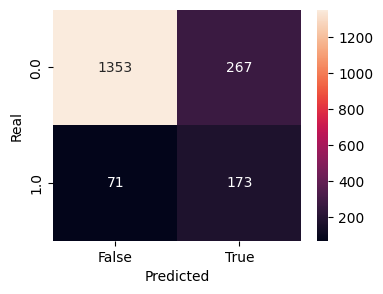

In [133]:
umbral = 0.12 # por arriba del cual se clasificaría como clase 1
prediccion_test = np.where( model.predict_proba(X_test)[:, 1] > umbral, True, False)
data = {'y_Real':  y_test,
        'y_Prediccion': prediccion_test
        }

evaluacion_df = pd.DataFrame(data)
confusion_matrix = pd.crosstab(evaluacion_df['y_Real'], evaluacion_df['y_Prediccion'], rownames=['Real'], colnames=['Predicted'])
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(confusion_matrix, annot=True, fmt='g')
plt.show()

# Bosque Aleatorio

## Entrenamiento y prueba


In [134]:
clf_rf = RandomForestClassifier(n_estimators=1000,  random_state =0,
                                criterion='entropy').fit(X_train, y_train)


y_pred = clf_rf.predict(X_test)
print("Exactitud del modelo Bosque Aleatorio en el conjunto de prueba: {:4.2f}%".format(accuracy_score(y_test, y_pred)*100))


Exactitud del modelo Bosque Aleatorio en el conjunto de prueba: 90.13%


<Axes: >

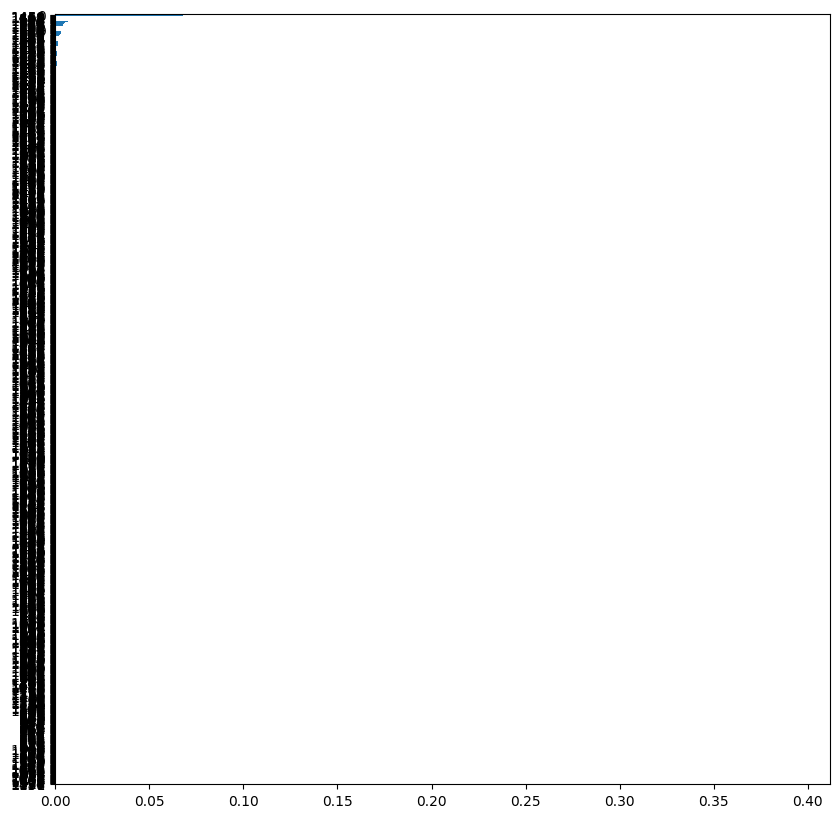

In [136]:
importances = clf_rf.feature_importances_
weights = pd.Series(importances,
                    index=new_X.columns.values)
weights.sort_values().plot(kind = 'barh',figsize=(10, 10))

In [137]:
clf_rf.predict_proba(X_test)

array([[0.971, 0.029],
       [0.976, 0.024],
       [0.999, 0.001],
       ...,
       [0.997, 0.003],
       [1.   , 0.   ],
       [0.355, 0.645]])